載入套件

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import talib as ta
import datetime
import vectorbt as vbt
import optuna
import hiplot as hip
import warnings

warnings.filterwarnings("ignore")

讀取資料並檢查資料無誤

In [2]:
all_data = pd.read_csv('BTCUSDT-1h-data.csv')
all_data['Timestamp'] = pd.to_datetime(all_data['Timestamp'])  
all_data.head()

,Timestamp,Open,High,Low,Close,Volume,Close_time,Quote_av,Trades,Tb_base_av,Tb_quote_av,Ignore
0,2017-08-17 04:00:00,4261.48,4313.62,4261.32,4308.83,47.181009,1.502946e+12,202366.138393,171.0,35.160503,150952.477943,0.0
1,2017-08-17 05:00:00,4308.83,4328.69,4291.37,4315.32,23.234916,1.502950e+12,100304.823567,102.0,21.448071,92608.279728,0.0
2,2017-08-17 06:00:00,4330.29,4345.45,4309.37,4324.35,7.229691,1.502953e+12,31282.312670,36.0,4.802861,20795.317224,0.0
3,2017-08-17 07:00:00,4316.62,4349.99,4287.41,4349.99,4.443249,1.502957e+12,19241.058300,25.0,2.602292,11291.347015,0.0
4,2017-08-17 08:00:00,4333.32,4377.85,4333.32,4360.69,0.972807,1.502960e+12,4239.503586,28.0,0.814655,3552.746817,0.0


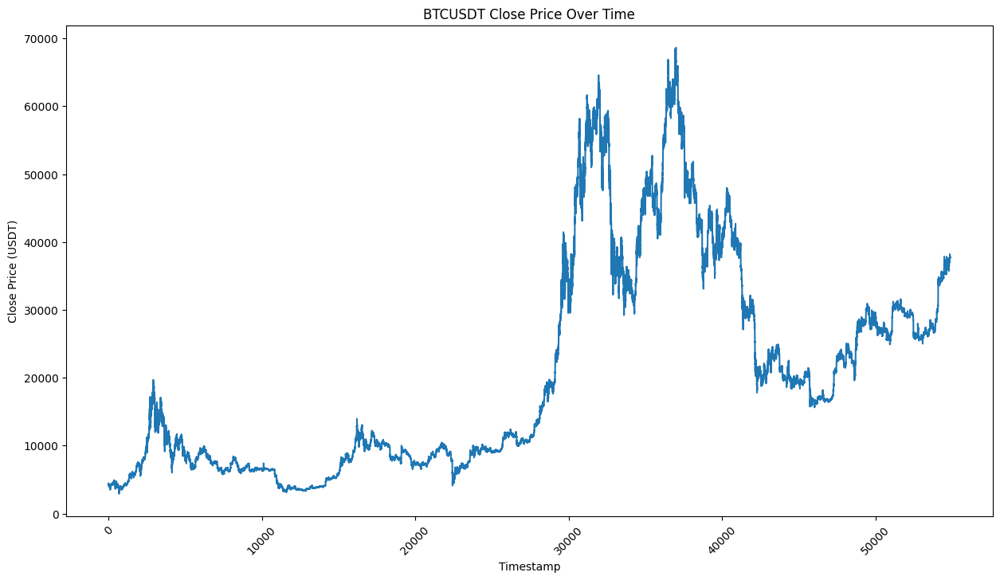

In [3]:
plt.figure(figsize=(15, 8))
plt.plot(all_data.index, all_data['Close'], label='Closing Price')
plt.title('BTCUSDT Close Price Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Close Price (USDT)')
plt.xticks(rotation=45)
plt.show()

切割資料

In [4]:
split_index = int(len(all_data) * 0.85)

train_data = all_data[:split_index]
test_data =  all_data[split_index:]

策略一：DMA+ADX 順勢

maximize return

In [5]:
import optuna
import numpy as np
import pandas as pd

# 定義目標函數
def objective(trial):
    # 在這裡定義您要嘗試優化的參數
    emafast_period = trial.suggest_int('emafast_period', 4, 48, 4)
    emaslow_period = trial.suggest_int('emaslow_period', 12, 96, 4)
    ADX_period = trial.suggest_int('ADX_period', 30, 30)
    timeperiod = trial.suggest_int('timeperiod', 12, 48, 4)
    
    train_data['EMAslow'] = ta.EMA(train_data['Close'], emaslow_period)
    train_data['EMAfast'] = ta.EMA(train_data['Close'], emafast_period)
    train_data['ADX'] = ta.ADX(train_data['High'], train_data['Low'], train_data['Close'], timeperiod)
    
    
    # 產生進場信號
    sig = pd.DataFrame(columns = ['long_entry', 'long_exit','short_entry', 'short_exit'])
    sig['long_entry'] = np.where((train_data['EMAfast'] > train_data['EMAslow']) & (train_data['ADX'] > ADX_period), 1, 0)
    sig['long_exit'] = np.where((train_data['EMAfast'] < train_data['EMAslow']), 1, 0)
    sig['short_entry'] = np.where((train_data['EMAfast'] < train_data['EMAslow']) & (train_data['ADX'] > ADX_period), 1, 0)
    sig['short_exit'] = np.where((train_data['EMAfast'] > train_data['EMAslow']), 1, 0)

    pf1 = vbt.Portfolio.from_signals(train_data['Close'],
                                entries=sig['long_entry'],
                                exits=sig['long_exit'],
                                short_entries=sig['short_entry'],
                                short_exits=sig['short_exit'],
                                freq='h',
                                fees = 0.001,
                                )
    a = pf1.stats()
    
    return a['Total Return [%]']  # optuna 會嘗試最小化這個值

# 執行 optuna 最佳化
study = optuna.create_study(direction='maximize')  # 注意這裡使用 'maximize'，因為我們希望最大化收益率
study.optimize(objective, n_trials=500)

# 獲取最佳參數
print(f"Best Parameters: {study.best_params}")
print("Best value:", study.best_value)


[I 2024-01-02 15:04:12,254] A new study created in memory with name: no-name-e5b9bff3-2604-4e1c-8e33-1c1bce331f1b
[I 2024-01-02 15:04:18,312] Trial 0 finished with value: 75.88587515543492 and parameters: {'emafast_period': 28, 'emaslow_period': 36, 'ADX_period': 30, 'timeperiod': 36}. Best is trial 0 with value: 75.88587515543492.
[I 2024-01-02 15:04:18,367] Trial 1 finished with value: 195.29971765809154 and parameters: {'emafast_period': 24, 'emaslow_period': 56, 'ADX_period': 30, 'timeperiod': 20}. Best is trial 1 with value: 195.29971765809154.
[I 2024-01-02 15:04:18,421] Trial 2 finished with value: 46.04200380564046 and parameters: {'emafast_period': 24, 'emaslow_period': 36, 'ADX_period': 30, 'timeperiod': 24}. Best is trial 1 with value: 195.29971765809154.
[I 2024-01-02 15:04:18,476] Trial 3 finished with value: 816.425900939528 and parameters: {'emafast_period': 48, 'emaslow_period': 76, 'ADX_period': 30, 'timeperiod': 24}. Best is trial 3 with value: 816.425900939528.
[I 20

Best Parameters: {'emafast_period': 44, 'emaslow_period': 84, 'ADX_period': 30, 'timeperiod': 28}
Best value: 1046.322932965389


In [6]:
hip.Experiment.from_optuna(study).display()

<IPython.core.display.Javascript object>

train result

In [7]:
EMAfast_p = study.best_params['emafast_period']
EMAslow_p = study.best_params['emaslow_period']
ADX_threshold_p = 30
timeperiod_p = study.best_params['timeperiod']

In [8]:
train_data['EMAslow'] = ta.EMA(train_data['Close'], EMAslow_p)
train_data['EMAfast'] = ta.EMA(train_data['Close'], EMAfast_p)
train_data['ADX'] = ta.ADX(train_data['High'], train_data['Low'], train_data['Close'], timeperiod_p)
    
    
# 產生進場信號
sig = pd.DataFrame(columns = ['long_entry', 'long_exit','short_entry', 'short_exit'])
sig['long_entry'] = np.where((train_data['EMAfast'] > train_data['EMAslow']) & (train_data['ADX'] > ADX_threshold_p) , 1, 0)
sig['long_exit'] = np.where((train_data['EMAfast'] < train_data['EMAslow']), 1, 0)
sig['short_entry'] = np.where((train_data['EMAfast'] < train_data['EMAslow']) & (train_data['ADX'] > ADX_threshold_p) , 1, 0)
sig['short_exit'] = np.where((train_data['EMAfast'] > train_data['EMAslow']), 1, 0)

pft = vbt.Portfolio.from_signals(train_data['Close'],
                                entries=sig['long_entry'],
                                exits=sig['long_exit'],
                                short_entries=sig['short_entry'],
                                short_exits=sig['short_exit'],
                                freq='h',
                                fees = 0.001)
pft.stats()

Start                                                  0
End                                                46650
Period                                1943 days 19:00:00
Start Value                                        100.0
End Value                                    1146.322933
Total Return [%]                             1046.322933
Benchmark Return [%]                          288.494789
Max Gross Exposure [%]                             100.0
Total Fees Paid                               176.302673
Max Drawdown [%]                               41.707277
Max Drawdown Duration                  272 days 04:00:00
Total Trades                                         137
Total Closed Trades                                  136
Total Open Trades                                      1
Open Trade PnL                                 -5.997719
Win Rate [%]                                   44.852941
Best Trade [%]                                118.326197
Worst Trade [%]                

In [9]:
fig = pft.plot(subplots=['cum_returns', 'orders', 'trade_pnl'])
fig.show()

test result

In [10]:
test_data['ADX'] = ta.ADX(test_data['High'], test_data['Low'], test_data['Close'], timeperiod_p)
test_data['EMAslow'] = ta.EMA(test_data['Close'], EMAslow_p)
test_data['EMAfast'] = ta.EMA(test_data['Close'], EMAfast_p)

signal = pd.DataFrame(columns=['long_entry', 'long_exit', 'short_entry', 'short_exit'])
signal['long_entry'] = np.where((test_data['EMAfast'] > test_data['EMAslow']) & (test_data['ADX'] > ADX_threshold_p) , 1, 0)
signal['long_exit'] = np.where((test_data['EMAfast'] < test_data['EMAslow']), 1, 0)
signal['short_entry'] = np.where((test_data['EMAfast'] < test_data['EMAslow']) & (test_data['ADX'] > ADX_threshold_p) , 1, 0)
signal['short_exit'] = np.where((test_data['EMAfast'] > test_data['EMAslow']) , 1, 0)

pf1 = vbt.Portfolio.from_signals(test_data['Close'],
                                entries=signal['long_entry'],
                                exits=signal['long_exit'],
                                short_entries=signal['short_entry'],
                                short_exits=signal['short_exit'],
                                freq='h',
                                fees = 0.001)
pf1.stats()

Start                                     46651
End                                       54883
Period                        343 days 01:00:00
Start Value                               100.0
End Value                            169.497506
Total Return [%]                      69.497506
Benchmark Return [%]                 125.712864
Max Gross Exposure [%]                    100.0
Total Fees Paid                        7.323531
Max Drawdown [%]                      17.964401
Max Drawdown Duration         215 days 06:00:00
Total Trades                                 25
Total Closed Trades                          25
Total Open Trades                             0
Open Trade PnL                              0.0
Win Rate [%]                               36.0
Best Trade [%]                        32.648475
Worst Trade [%]                       -6.435106
Avg Winning Trade [%]                 11.699969
Avg Losing Trade [%]                  -2.542417
Avg Winning Trade Duration     12 days 0

In [11]:
fig = pf1.plot(subplots=['cum_returns', 'orders', 'trade_pnl'])
fig.show()